#### Need to install the following
#### pip3 install boto3
#### pip3 install fsspec
#### python -m pip install "xarray[complete]"
#### start jupyterlab using jupyter-lab

In [1]:
import json
import boto3
import fsspec
import numpy as np
import xarray as xr
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import gc
from dash import dcc
import plotly.express as px

#### look at the jsons
#### link to boto3 api signature for download_file is https://boto3.amazonaws.com/v1/documentation/api/latest/reference/services/s3/client/download_file.html

#### The data/parameters in POWER Release 901 are provided on a global grid with spatial resolutions equal to the input data. That resolution is 1.0° latitude by 1.0° longitude for the radiation data sets and ½° latitude by ⅝° longitude for the meteorological data sets. The grid reference system is WGS84

In [4]:
aws_access_key_id = 'AWS_ACCESS_KEY_ID'
aws_secret_access_key = 'AWS_SECRET_ACCESS_KEY'
s3_client = boto3.client('s3', aws_access_key_id = os.getenv(aws_access_key_id), aws_secret_access_key = os.getenv(aws_secret_access_key))

bucket_contents = s3_client.list_objects_v2(Bucket='power-analysis-ready-datastore')

list_of_objs_in_bucket = bucket_contents['Contents']

for i in range(len(list_of_objs_in_bucket)):
    if 'json' in list_of_objs_in_bucket[i]['Key']:
        print(list_of_objs_in_bucket[i]['Key'])
        s3_client.download_file('power-analysis-ready-datastore', list_of_objs_in_bucket[i]['Key'], list_of_objs_in_bucket[i]['Key'])
        with open(list_of_objs_in_bucket[i]['Key'], 'r') as f:
            json_data = json.load(f)
            print(json_data)

ceres.json
{'last': '2023/06/01'}
extra_last_data_processing.json
{'last': '2023/03/21'}
extra_last_data_sync.json
{'last': '2023/03/22'}
extra_processing_allowed.json
{'status': False}
flashflux.json
{'last': '2023/09/05'}
geos5124.json
{'last': '2023/09/08'}
imerg-final.json
{'last': '2021/09/30'}
imerg-late.json
{'last': '2023/03/20'}
last_data_processing.json
{'last': '2023/09/10'}
last_data_sync.json
{'last': '2023/09/10'}
merra2.json
{'last': '2023/06/01'}


In [ ]:
s3_client.download_file('power-analysis-ready-datastore', 'ceres.json', 'ceres.json')

with open('ceres.json', 'r') as f:
    json_data = json.load(f)

In [3]:
filepath = 'https://power-analysis-ready-datastore.s3.amazonaws.com/power_901_annual_meteorology_utc.zarr'
filepath_mapped = fsspec.get_mapper(filepath)

ds = xr.open_zarr(store=filepath_mapped, consolidated=True)

/Users/sumangangopadhyay/nasa-power-data-exploration/nasa_power_venv/lib/python3.8/site-packages/xarray/backends/plugins.py:71: RuntimeWarning: Engine 'cfgrib' loading failed:
Cannot find the ecCodes library
  warnings.warn(f"Engine {name!r} loading failed:\n{ex}", RuntimeWarning)


In [4]:
ds

<xarray.Dataset>
Dimensions:          (time: 41, lat: 361, lon: 576)
Coordinates:
  * lat              (lat) float64 -90.0 -89.5 -89.0 -88.5 ... 89.0 89.5 90.0
  * lon              (lon) float64 -180.0 -179.4 -178.8 ... 178.1 178.8 179.4
  * time             (time) datetime64[ns] 1981-12-31 1982-12-31 ... 2021-12-31
Data variables: (12/94)
    CDD0             (time, lat, lon) float64 dask.array<chunksize=(41, 25, 25), meta=np.ndarray>
    CDD10            (time, lat, lon) float64 dask.array<chunksize=(41, 25, 25), meta=np.ndarray>
    CDD18_3          (time, lat, lon) float64 dask.array<chunksize=(41, 25, 25), meta=np.ndarray>
    DISPH            (time, lat, lon) float64 dask.array<chunksize=(41, 25, 25), meta=np.ndarray>
    EVLAND           (time, lat, lon) float64 dask.array<chunksize=(41, 25, 25), meta=np.ndarray>
    EVPTRNS          (time, lat, lon) float64 dask.array<chunksize=(41, 25, 25), meta=np.ndarray>
    ...               ...
    WS50M_MAX_AVG    (time, lat, lon) float64 dask.array<chunksize=(41, 25, 25), meta=np.ndarray>
    WS50M_MIN        (time, lat, lon) float64 dask.array<chunksize=(41, 25, 25), meta=np.ndarray>
    WS50M_MIN_AVG    (time, lat, lon) float64 dask.array<chunksize=(41, 25, 25), meta=np.ndarray>
    WS50M_RANGE      (time, lat, lon) float64 dask.array<chunksize=(41, 25, 25), meta=np.ndarray>
    WS50M_RANGE_AVG  (time, lat, lon) float64 dask.array<chunksize=(41, 25, 25), meta=np.ndarray>
    Z0M              (time, lat, lon) float64 dask.array<chunksize=(41, 25, 25), meta=np.ndarray>
Attributes: (12/37)
    acknowledgement:            The Prediction of Worldwide Energy Resources ...
    comment:                    Version 9.0.1 includes source data resolution.
    conventions:                CF-1.8, ACDD-1.3
    creator_email:              bradley.macpherson@nasa.gov
    creator_name:               Bradley Macpherson
    date_created:               2022-04-11T12:20:00.000000
    ...                         ...
    time_coverage_end:          2021-12-31T00:00:00
    time_coverage_resolution:   P1Y
    time_coverage_start:        1981-01-01T00:00:00
    time_standard:              Universal Time Coordinated (UTC)
    title:                      POWER Annual Meteorology Time Series
    version:                    POWER Version 9.0.1

In [4]:
ds.attrs['history']

'The POWER project was established in the early 2000s to support distribution of NASA research products.'

In [5]:
ds["lat"]

<xarray.DataArray 'lat' (lat: 361)>
array([-90. , -89.5, -89. , ...,  89. ,  89.5,  90. ])
Coordinates:
  * lat      (lat) float64 -90.0 -89.5 -89.0 -88.5 -88.0 ... 88.5 89.0 89.5 90.0
Attributes:
    long_name:      latitude
    standard_name:  latitude
    units:          degrees_north

In [51]:
ds["CDD0"]

<xarray.DataArray 'CDD0' (time: 41, lat: 361, lon: 576)>
dask.array<open_dataset-6ccc4cfdb951df325efc616b32f81e4aCDD0, shape=(41, 361, 576), dtype=float64, chunksize=(41, 25, 25), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 -90.0 -89.5 -89.0 -88.5 -88.0 ... 88.5 89.0 89.5 90.0
  * lon      (lon) float64 -180.0 -179.4 -178.8 -178.1 ... 178.1 178.8 179.4
  * time     (time) datetime64[ns] 1981-12-31 1982-12-31 ... 2021-12-31
Attributes:
    long_name:      Cooling Degree Days Above 0 C
    standard_name:  Cooling_Degree_Days_Above_0_C
    units:          degree-day

In [5]:
#ds.data_vars["CDD0"].attrs
#type(ds.data_vars)
for i in ds.data_vars:
    #print(ds[i].attrs['long_name'] + '----' + ds[i].attrs['units'])
    print(i + ' --> ' + ds[i].attrs['long_name'])
    #print(ds[i].attrs)

CDD0 --> Cooling Degree Days Above 0 C
CDD10 --> Cooling Degree Days Above 10 C
CDD18_3 --> Cooling Degree Days Above 18.3 C
DISPH --> Zero Plane Displacement Height
EVLAND --> Evaporation Land
EVPTRNS --> Evapotranspiration Energy Flux
FROST_DAYS --> Frost Days
FRSEAICE --> Ice Covered Fraction
FRSNO --> Land Snowcover Fraction
GWETPROF --> Profile Soil Moisture
GWETROOT --> Root Zone Soil Wetness
GWETTOP --> Surface Soil Wetness
HDD0 --> Heating Degree Days Below 0 C
HDD10 --> Heating Degree Days Below 10 C
HDD18_3 --> Heating Degree Days Below 18.3 C
PBLTOP --> Planetary Boundary Layer Top Pressure
PRECSNO --> Snow Precipitation
PRECSNOLAND --> Snow Precipitation Land
PRECSNOLAND_SUM --> Snow Precipitation Land Sum
PRECTOTCORR --> Precipitation Corrected 
PRECTOTCORR_SUM --> Precipitation Corrected Sum
PS --> Surface Pressure
QV10M --> Specific Humidity at 10 Meters
QV2M --> Specific Humidity at 2 Meters
RH2M --> Relative Humidity at 2 Meters
RHOA --> Surface Air Density
SLP --> Sea

#### CDD0, CDD10, CDD18_3 : Cooling Degree Days Above 0, 10, 18.3 degree Celcius respectively, to know details, look at https://www.weather.gov/key/climate_heat_cool
#### HDD0, HDD10, HDD18_3 : Heating Degree Days Above 0, 10, 18.3 degree Celcius respectively, to know details, look at https://www.weather.gov/key/climate_heat_cool
#### DISPH : Zero Plane displacement is defined as the height at which the mean velocity is zero due to large obstacles such as buildings/canopy 
#### EVLAND : Evaporation from land is considered as a process of water vapor transfer from the evaporating surface to the atmosphere
#### EVPTRNS : water vapor evaporating from the soil surface and from the liquid water on plant surfaces together with that transpired from within plant surfaces
#### FROST_DAYS : A frost day is one on which the coldest temperature of the day is lower than 0 °C
#### FRSEAICE : Fraction of ocean covered with sea ice
#### FRSNO : fractional snow cover is the fraction of an area (e.g. a pixel in a remote sensing product) covered with snow
#### GWETPROF : It's calculated by weighing the wet soil sampled from the field, drying it in an oven, and then weighing the dry soil. Thus gravimetric water content equals the wet soil mass minus the dry soil mass divided by the dry soil mass
#### GWETROOT : The water and moisture in the soil to a depth of 39 inches is called root zone moisture
#### GWETTOP : the relative water content of the top few centimetres soil, describing how wet or dry the soil is in its topmost layer
#### PBLTOP : Pressure at the Planetary Boundary Layer (PBL) is the pressure at the lowest part of the troposphere which is subject to direct earth-atmosphere influence because of its proximity to the surface of the earth
#### T2MWET : The wet-bulb temperature is the temperature read by a thermometer covered in water-soaked cloth over which air is passed. At 100% relative humidity, the wet-bulb temperature is equal to the air temperature
#### TS : Refers to the effective radiating temperature of the soil plus canopy surface. It is inferred from satellites in the 8-12 um window region. In climate models, it is the temperature used to determine upward thermal emission.
#### TROPT, TROPPB, TROPQ: The tropopause is the boundary between the troposphere and stratosphere. Tropospheric processes, such as the water or hydrologic cycle (the formation of clouds and rain) and the greenhouse effect, have a great influence on meteorology and the climate. The chemical composition determines the air quality.

In [25]:
#ds["CDD0"].to_dataframe().head(10)
#ds["CDD0"][0,0,0]
#CDD0_df = ds["CDD0"].loc["2021-12-31",].to_dataframe()

CDD0_df = ds["CDD0"].to_dataframe()
CDD0_df = CDD0_df.reset_index(level=['lat', 'lon', 'time'])
print(CDD0_df.shape)
CDD0_df = CDD0_df[~CDD0_df["CDD0"].isna()]
print("after removing NaNs")
print(CDD0_df.shape)
print(CDD0_df.memory_usage(deep=True).sum()/1024/1024, " MBs")
CDD0_df.head(10)

(8525376, 4)
after removing NaNs
(8525376, 4)
325.21728515625  MBs


,time,lat,lon,CDD0
0,1981-12-31,-90.0,-180.000,0.0
1,1981-12-31,-90.0,-179.375,0.0
2,1981-12-31,-90.0,-178.750,0.0
3,1981-12-31,-90.0,-178.125,0.0
4,1981-12-31,-90.0,-177.500,0.0
5,1981-12-31,-90.0,-176.875,0.0
6,1981-12-31,-90.0,-176.250,0.0
7,1981-12-31,-90.0,-175.625,0.0
8,1981-12-31,-90.0,-175.000,0.0
9,1981-12-31,-90.0,-174.375,0.0


In [26]:
CDD10_df = ds["CDD10"].to_dataframe()
CDD10_df = CDD10_df.reset_index(level=['lat', 'lon', 'time'])
print(CDD10_df.shape)
CDD10_df = CDD10_df[~CDD10_df["CDD10"].isna()]
print("after removing NaNs")
print(CDD10_df.shape)
print(CDD10_df.memory_usage(deep=True).sum()/1024/1024, " MBs")
CDD10_df.head(10)

(8525376, 4)
after removing NaNs
(8525376, 4)
325.21728515625  MBs


,time,lat,lon,CDD10
0,1981-12-31,-90.0,-180.000,0.0
1,1981-12-31,-90.0,-179.375,0.0
2,1981-12-31,-90.0,-178.750,0.0
3,1981-12-31,-90.0,-178.125,0.0
4,1981-12-31,-90.0,-177.500,0.0
5,1981-12-31,-90.0,-176.875,0.0
6,1981-12-31,-90.0,-176.250,0.0
7,1981-12-31,-90.0,-175.625,0.0
8,1981-12-31,-90.0,-175.000,0.0
9,1981-12-31,-90.0,-174.375,0.0


In [23]:
CDD18_3_df = ds["CDD18_3"].to_dataframe()
CDD18_3_df = CDD18_3_df.reset_index(level=['lat', 'lon', 'time'])
print(CDD18_3_df.shape)
CDD18_3_df = CDD18_3_df[~CDD18_3_df["CDD18_3"].isna()]
print("after removing NaNs")
print(CDD18_3_df.shape)
print(CDD18_3_df.memory_usage(deep=True).sum()/1024/1024, " MBs")
CDD18_3_df.head(10)

(8525376, 4)
after removing NaNs
(8525376, 4)
325.21728515625  MBs


,time,lat,lon,CDD18_3
0,1981-12-31,-90.0,-180.000,0.0
1,1981-12-31,-90.0,-179.375,0.0
2,1981-12-31,-90.0,-178.750,0.0
3,1981-12-31,-90.0,-178.125,0.0
4,1981-12-31,-90.0,-177.500,0.0
5,1981-12-31,-90.0,-176.875,0.0
6,1981-12-31,-90.0,-176.250,0.0
7,1981-12-31,-90.0,-175.625,0.0
8,1981-12-31,-90.0,-175.000,0.0
9,1981-12-31,-90.0,-174.375,0.0


In [27]:
CDD0_10_joined_df = pd.merge(CDD10_df, CDD0_df, on=['time','lat','lon'], how='inner')
CDD_joined_df = pd.merge(CDD0_10_joined_df, CDD18_3_df, on=['time','lat','lon'], how='inner')
print(CDD_joined_df.shape)

(8525376, 6)


In [29]:
CDD_joined_df[(CDD_joined_df['CDD18_3'] > 0) | (CDD_joined_df['CDD10'] > 0) | (CDD_joined_df['CDD0'] > 0)].head(10)

,time,lat,lon,CDD10,CDD0,CDD18_3
15028,1981-12-31,-77.0,-147.500,0.0,0.0625,0.0
15527,1981-12-31,-77.0,164.375,0.0,0.1250,0.0
15546,1981-12-31,-77.0,176.250,0.0,0.1250,0.0
15547,1981-12-31,-77.0,176.875,0.0,0.1250,0.0
15548,1981-12-31,-77.0,177.500,0.0,0.0625,0.0
15549,1981-12-31,-77.0,178.125,0.0,0.0625,0.0
15550,1981-12-31,-77.0,178.750,0.0,0.0625,0.0
15734,1981-12-31,-76.5,-66.250,0.0,0.1250,0.0
16103,1981-12-31,-76.5,164.375,0.0,0.3750,0.0
16110,1981-12-31,-76.5,168.750,0.0,0.0625,0.0


In [28]:
del CDD10_df
del CDD0_df
del CDD18_3_df
gc.collect()

5332

In [30]:
#CDD_joined_df.groupby(['time','lat'])['lon'].count().reset_index(level=['time', 'lat'])

dq_chk_1 = CDD_joined_df.groupby(['time','lat']).agg(longitude_count_per_latitude=('lon', 'count')).reset_index(level=['time', 'lat'])
print(dq_chk_1[dq_chk_1['longitude_count_per_latitude'] != 576].shape)

dq_chk_1 = CDD_joined_df.groupby(['time','lon']).agg(latitude_count_per_longitude=('lat', 'count')).reset_index(level=['time', 'lon'])
print(dq_chk_1[dq_chk_1['latitude_count_per_longitude'] != 361].shape)

del dq_chk_1
gc.collect()

(0, 3)
(0, 3)


0

In [46]:
CDD_joined_df_long = CDD_joined_df.melt(id_vars=['time', 'lat', 'lon'], value_vars=['CDD10', 'CDD0', 'CDD18_3']
                                       ,var_name='cooling_degree_days', value_name='cooling_degree_days_value')

In [47]:
kolkata_df = CDD_joined_df_long[(CDD_joined_df_long['lat'] == 22) & (CDD_joined_df_long['lon'] == 87.5)]
kolkata_df.shape

(123, 5)

In [48]:
kolkata_df

,time,lat,lon,cooling_degree_days,cooling_degree_days_value
129452,1981-12-31,22.0,87.5,CDD10,5721.6875
337388,1982-12-31,22.0,87.5,CDD10,6002.4375
545324,1983-12-31,22.0,87.5,CDD10,6236.3750
753260,1984-12-31,22.0,87.5,CDD10,5990.4375
961196,1985-12-31,22.0,87.5,CDD10,6089.0000
...,...,...,...,...,...
24665900,2017-12-31,22.0,87.5,CDD18_3,2926.5625
24873836,2018-12-31,22.0,87.5,CDD18_3,2854.1875
25081772,2019-12-31,22.0,87.5,CDD18_3,2974.1875
25289708,2020-12-31,22.0,87.5,CDD18_3,2725.0000


In [49]:
bengaluru_df = CDD_joined_df_long[(CDD_joined_df_long['lat'] == 13) & (CDD_joined_df_long['lon'] == 77.5)]
bengaluru_df.shape

(123, 5)

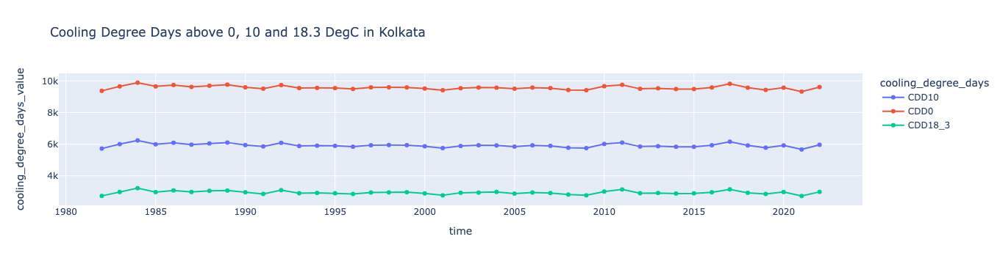

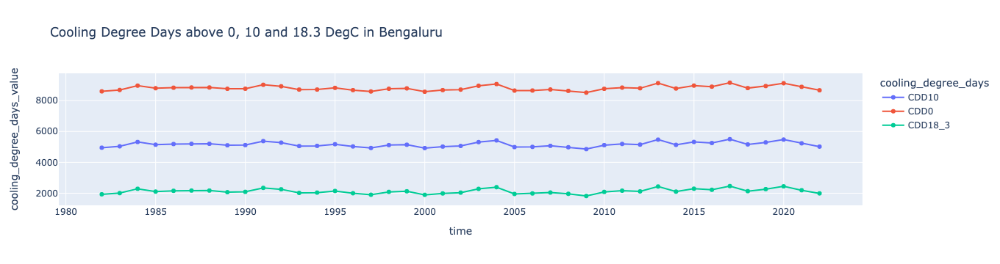

In [50]:
fig1 = px.line(kolkata_df, x="time", y="cooling_degree_days_value"
               , color="cooling_degree_days", markers=True, title='Cooling Degree Days above 0, 10 and 18.3 DegC in Kolkata')
fig2 = px.line(bengaluru_df, x="time", y="cooling_degree_days_value"
               , color="cooling_degree_days", markers=True, title='Cooling Degree Days above 0, 10 and 18.3 DegC in Bengaluru')
#dcc.Graph(figure=fig)
fig1.show()
fig2.show()

#### The degree-days are calculated for a whole year, so they are degree-day for a day multiplied by the days in that year

In [52]:
filepath = 'https://power-analysis-ready-datastore.s3.amazonaws.com/power_901_daily_meteorology_utc.zarr'
filepath_mapped = fsspec.get_mapper(filepath)

ds_daily = xr.open_zarr(store=filepath_mapped, consolidated=True)

In [134]:
ds_daily.CDD10

<xarray.DataArray 'CDD10' (time: 16071, lat: 361, lon: 576)>
dask.array<open_dataset-48ce4abbbfadea3a807e6be234ef8632CDD10, shape=(16071, 361, 576), dtype=float64, chunksize=(14610, 5, 5), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 -90.0 -89.5 -89.0 -88.5 -88.0 ... 88.5 89.0 89.5 90.0
  * lon      (lon) float64 -180.0 -179.4 -178.8 -178.1 ... 178.1 178.8 179.4
  * time     (time) datetime64[ns] 1981-01-01 1981-01-02 ... 2024-12-31
Attributes:
    long_name:      Cooling Degree Days Above 10 C
    standard_name:  Cooling_Degree_Days_Above_10_C
    units:          degree-day

In [91]:
ds_daily_lat_22 = ds_daily.lat.values
ds_daily_lat_22

array([-90. , -89.5, -89. , -88.5, -88. , -87.5, -87. , -86.5, -86. ,
       -85.5, -85. , -84.5, -84. , -83.5, -83. , -82.5, -82. , -81.5,
       -81. , -80.5, -80. , -79.5, -79. , -78.5, -78. , -77.5, -77. ,
       -76.5, -76. , -75.5, -75. , -74.5, -74. , -73.5, -73. , -72.5,
       -72. , -71.5, -71. , -70.5, -70. , -69.5, -69. , -68.5, -68. ,
       -67.5, -67. , -66.5, -66. , -65.5, -65. , -64.5, -64. , -63.5,
       -63. , -62.5, -62. , -61.5, -61. , -60.5, -60. , -59.5, -59. ,
       -58.5, -58. , -57.5, -57. , -56.5, -56. , -55.5, -55. , -54.5,
       -54. , -53.5, -53. , -52.5, -52. , -51.5, -51. , -50.5, -50. ,
       -49.5, -49. , -48.5, -48. , -47.5, -47. , -46.5, -46. , -45.5,
       -45. , -44.5, -44. , -43.5, -43. , -42.5, -42. , -41.5, -41. ,
       -40.5, -40. , -39.5, -39. , -38.5, -38. , -37.5, -37. , -36.5,
       -36. , -35.5, -35. , -34.5, -34. , -33.5, -33. , -32.5, -32. ,
       -31.5, -31. , -30.5, -30. , -29.5, -29. , -28.5, -28. , -27.5,
       -27. , -26.5,

In [100]:
CDD0_kol_daily_df = ds_daily.sel(lat=22, lon=87.5)["CDD0"].to_dataframe()
CDD0_kol_daily_df.head(10)

,lat,lon,CDD0
time,,,
1981-01-01,22.0,87.5,18.9375
1981-01-02,22.0,87.5,18.1250
1981-01-03,22.0,87.5,17.9375
1981-01-04,22.0,87.5,20.8125
1981-01-05,22.0,87.5,21.4375
1981-01-06,22.0,87.5,21.5625
1981-01-07,22.0,87.5,18.8125
1981-01-08,22.0,87.5,16.6875
1981-01-09,22.0,87.5,15.5000


In [101]:
CDD0_kol_daily_df = ds_daily.sel(lat=22, lon=87.5)["CDD0"].to_dataframe()
CDD0_kol_daily_df = CDD0_kol_daily_df.reset_index(level=['time'])
print(CDD0_kol_daily_df.shape)
CDD0_kol_daily_df = CDD0_kol_daily_df[~CDD0_kol_daily_df["CDD0"].isna()]
print("after removing NaNs")
print(CDD0_kol_daily_df.shape)
print(CDD0_kol_daily_df.memory_usage(deep=True).sum()/1024/1024, " MBs")
CDD0_kol_daily_df.head(10)

(16071, 4)
after removing NaNs
(15404, 4)
0.587615966796875  MBs


,time,lat,lon,CDD0
0,1981-01-01,22.0,87.5,18.9375
1,1981-01-02,22.0,87.5,18.1250
2,1981-01-03,22.0,87.5,17.9375
3,1981-01-04,22.0,87.5,20.8125
4,1981-01-05,22.0,87.5,21.4375
5,1981-01-06,22.0,87.5,21.5625
6,1981-01-07,22.0,87.5,18.8125
7,1981-01-08,22.0,87.5,16.6875
8,1981-01-09,22.0,87.5,15.5000
9,1981-01-10,22.0,87.5,15.3750


In [113]:
CDD10_kol_daily_df = ds_daily.sel(lat=22, lon=87.5)["CDD10"].to_dataframe()
CDD10_kol_daily_df = CDD10_kol_daily_df.reset_index(level=['time'])
print(CDD10_kol_daily_df.shape)
CDD10_kol_daily_df = CDD10_kol_daily_df[~CDD10_kol_daily_df["CDD10"].isna()]
print("after removing NaNs")
print(CDD10_kol_daily_df.shape)
print(CDD10_kol_daily_df.memory_usage(deep=True).sum()/1024/1024, " MBs")
CDD10_kol_daily_df.head(10)

(16071, 4)
after removing NaNs
(15405, 4)
0.5876541137695312  MBs


,time,lat,lon,CDD10
0,1981-01-01,22.0,87.5,8.9375
1,1981-01-02,22.0,87.5,8.1250
2,1981-01-03,22.0,87.5,7.9375
3,1981-01-04,22.0,87.5,10.8125
4,1981-01-05,22.0,87.5,11.4375
5,1981-01-06,22.0,87.5,11.5625
6,1981-01-07,22.0,87.5,8.8125
7,1981-01-08,22.0,87.5,6.6875
8,1981-01-09,22.0,87.5,5.5000
9,1981-01-10,22.0,87.5,5.3750


In [114]:
CDD18_3_kol_daily_df = ds_daily.sel(lat=22, lon=87.5)["CDD18_3"].to_dataframe()
CDD18_3_kol_daily_df = CDD18_3_kol_daily_df.reset_index(level=['time'])
print(CDD18_3_kol_daily_df.shape)
CDD18_3_kol_daily_df = CDD18_3_kol_daily_df[~CDD18_3_kol_daily_df["CDD18_3"].isna()]
print("after removing NaNs")
print(CDD18_3_kol_daily_df.shape)
print(CDD18_3_kol_daily_df.memory_usage(deep=True).sum()/1024/1024, " MBs")
CDD18_3_kol_daily_df.head(10)

(16071, 4)
after removing NaNs
(15405, 4)
0.5876541137695312  MBs


,time,lat,lon,CDD18_3
0,1981-01-01,22.0,87.5,0.625
1,1981-01-02,22.0,87.5,0.000
2,1981-01-03,22.0,87.5,0.000
3,1981-01-04,22.0,87.5,2.500
4,1981-01-05,22.0,87.5,3.125
5,1981-01-06,22.0,87.5,3.250
6,1981-01-07,22.0,87.5,0.500
7,1981-01-08,22.0,87.5,0.000
8,1981-01-09,22.0,87.5,0.000
9,1981-01-10,22.0,87.5,0.000


In [115]:
CDD0_10_kol_daily_joined_df = pd.merge(CDD10_kol_daily_df, CDD0_kol_daily_df, on=['time','lat','lon'], how='inner')
CDD_kol_daily_joined_df = pd.merge(CDD0_10_kol_daily_joined_df, CDD18_3_kol_daily_df, on=['time','lat','lon'], how='inner')
print(CDD_kol_daily_joined_df.shape)

CDD_kol_daily_joined_df_long = CDD_kol_daily_joined_df.melt(id_vars=['time', 'lat', 'lon'], value_vars=['CDD10', 'CDD0', 'CDD18_3']
                                       ,var_name='cooling_degree_days', value_name='cooling_degree_days_value')

del CDD10_kol_daily_df, CDD0_kol_daily_df, CDD18_3_kol_daily_df
gc.collect()

(15404, 7)


1469

In [119]:
CDD_kol_daily_joined_df['year'] = pd.DatetimeIndex(CDD_kol_daily_joined_df['time']).year

CDD_kol_daily_joined_df.groupby(['year']).agg(CDD0_readings_per_year=('CDD0', 'count')
                                                  , CDD10_readings_per_year=('CDD10', 'count')
                                                  , CDD18_3_readings_per_year=('CDD18_3', 'count')).reset_index(level=['year'])

,year,CDD0_readings_per_year,CDD10_readings_per_year,CDD18_3_readings_per_year
0,1981,365,365,365
1,1982,365,365,365
2,1983,365,365,365
3,1984,366,366,366
4,1985,365,365,365
5,1986,365,365,365
6,1987,365,365,365
7,1988,366,366,366
8,1989,365,365,365
9,1990,365,365,365


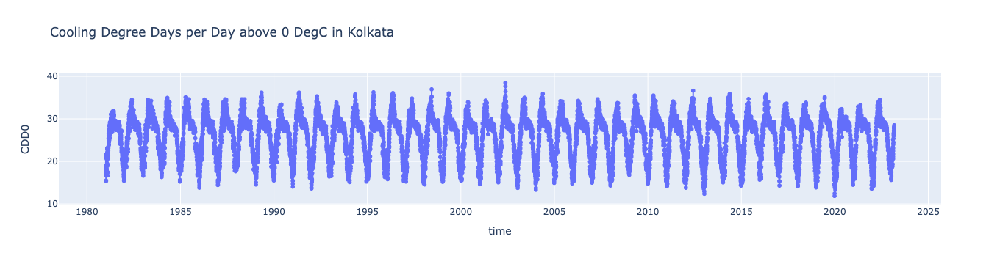

In [102]:
fig1 = px.line(CDD0_kol_daily_df, x="time", y="CDD0", markers=True, title='Cooling Degree Days per Day above 0 DegC in Kolkata')

fig1.show()

In [103]:
WS10M_kol_daily_df = ds_daily.sel(lat=22, lon=87.5)["WS10M"].to_dataframe()
WS10M_kol_daily_df = WS10M_kol_daily_df.reset_index(level=['time'])
print(WS10M_kol_daily_df.shape)
WS10M_kol_daily_df = WS10M_kol_daily_df[~WS10M_kol_daily_df["WS10M"].isna()]
print("after removing NaNs")
print(WS10M_kol_daily_df.shape)
print(WS10M_kol_daily_df.memory_usage(deep=True).sum()/1024/1024, " MBs")
WS10M_kol_daily_df.head(10)

(16071, 4)
after removing NaNs
(15404, 4)
0.587615966796875  MBs


,time,lat,lon,WS10M
0,1981-01-01,22.0,87.5,2.328125
1,1981-01-02,22.0,87.5,2.609375
2,1981-01-03,22.0,87.5,2.132812
3,1981-01-04,22.0,87.5,1.757812
4,1981-01-05,22.0,87.5,2.421875
5,1981-01-06,22.0,87.5,2.195312
6,1981-01-07,22.0,87.5,4.148438
7,1981-01-08,22.0,87.5,3.523438
8,1981-01-09,22.0,87.5,4.289062
9,1981-01-10,22.0,87.5,4.156250


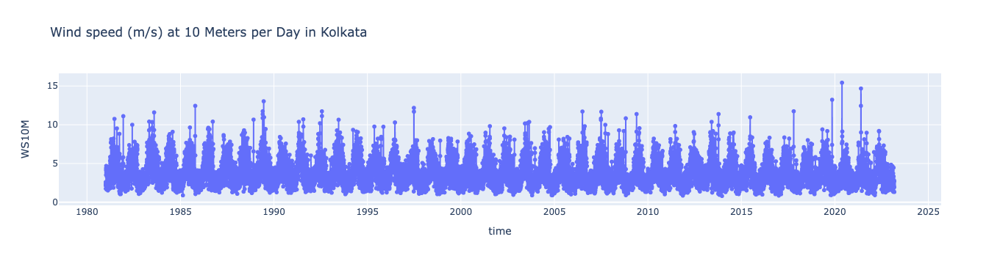

In [106]:
fig1 = px.line(WS10M_kol_daily_df, x="time", y="WS10M", markers=True, title='Wind speed (m/s) at 10 Meters per Day in Kolkata')

fig1.show()

#### Hurricane Amphan struck kolkata on May 20, 2020

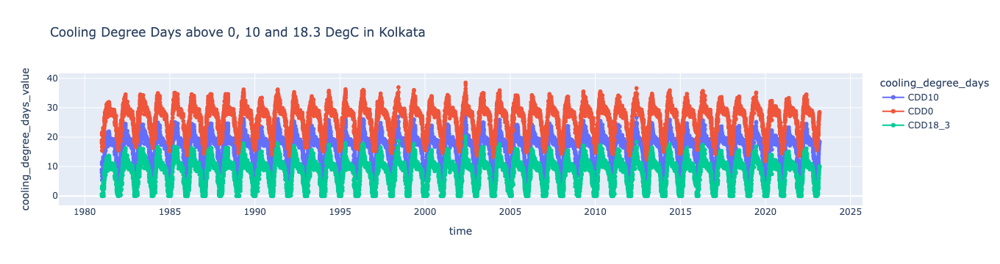

In [120]:
fig1 = px.line(CDD_kol_daily_joined_df_long, x="time", y="cooling_degree_days_value"
               , color="cooling_degree_days", markers=True, title='Cooling Degree Days above 0, 10 and 18.3 DegC in Kolkata')

fig1.show()

In [122]:
gc.collect()

3607

In [124]:
CDD_kol_daily_joined_df_long.columns = ['time', 'lat', 'lon', 'degree_days', 'degree_days_value']

In [125]:
HDD0_kol_daily_df = ds_daily.sel(lat=22, lon=87.5)["HDD0"].to_dataframe()
HDD0_kol_daily_df = HDD0_kol_daily_df.reset_index(level=['time'])
print(HDD0_kol_daily_df.shape)
HDD0_kol_daily_df = HDD0_kol_daily_df[~HDD0_kol_daily_df["HDD0"].isna()]
print("after removing NaNs")
print(HDD0_kol_daily_df.shape)
print(HDD0_kol_daily_df.memory_usage(deep=True).sum()/1024/1024, " MBs")
HDD0_kol_daily_df.head(10)

(16071, 4)
after removing NaNs
(15405, 4)
0.5876541137695312  MBs


,time,lat,lon,HDD0
0,1981-01-01,22.0,87.5,0.0
1,1981-01-02,22.0,87.5,0.0
2,1981-01-03,22.0,87.5,0.0
3,1981-01-04,22.0,87.5,0.0
4,1981-01-05,22.0,87.5,0.0
5,1981-01-06,22.0,87.5,0.0
6,1981-01-07,22.0,87.5,0.0
7,1981-01-08,22.0,87.5,0.0
8,1981-01-09,22.0,87.5,0.0
9,1981-01-10,22.0,87.5,0.0


In [127]:
HDD10_kol_daily_df = ds_daily.sel(lat=22, lon=87.5)["HDD10"].to_dataframe()
HDD10_kol_daily_df = HDD10_kol_daily_df.reset_index(level=['time'])
print(HDD10_kol_daily_df.shape)
HDD10_kol_daily_df = HDD10_kol_daily_df[~HDD10_kol_daily_df["HDD10"].isna()]
print("after removing NaNs")
print(HDD10_kol_daily_df.shape)
print(HDD10_kol_daily_df.memory_usage(deep=True).sum()/1024/1024, " MBs")
HDD10_kol_daily_df.head(10)

(16071, 4)
after removing NaNs
(15405, 4)
0.5876541137695312  MBs


,time,lat,lon,HDD10
0,1981-01-01,22.0,87.5,0.0
1,1981-01-02,22.0,87.5,0.0
2,1981-01-03,22.0,87.5,0.0
3,1981-01-04,22.0,87.5,0.0
4,1981-01-05,22.0,87.5,0.0
5,1981-01-06,22.0,87.5,0.0
6,1981-01-07,22.0,87.5,0.0
7,1981-01-08,22.0,87.5,0.0
8,1981-01-09,22.0,87.5,0.0
9,1981-01-10,22.0,87.5,0.0


In [128]:
HDD18_3_kol_daily_df = ds_daily.sel(lat=22, lon=87.5)["HDD18_3"].to_dataframe()
HDD18_3_kol_daily_df = HDD18_3_kol_daily_df.reset_index(level=['time'])
print(HDD18_3_kol_daily_df.shape)
HDD18_3_kol_daily_df = HDD18_3_kol_daily_df[~HDD18_3_kol_daily_df["HDD18_3"].isna()]
print("after removing NaNs")
print(HDD18_3_kol_daily_df.shape)
print(HDD18_3_kol_daily_df.memory_usage(deep=True).sum()/1024/1024, " MBs")
HDD18_3_kol_daily_df.head(10)

(16071, 4)
after removing NaNs
(15405, 4)
0.5876541137695312  MBs


,time,lat,lon,HDD18_3
0,1981-01-01,22.0,87.5,0.0000
1,1981-01-02,22.0,87.5,0.1875
2,1981-01-03,22.0,87.5,0.3750
3,1981-01-04,22.0,87.5,0.0000
4,1981-01-05,22.0,87.5,0.0000
5,1981-01-06,22.0,87.5,0.0000
6,1981-01-07,22.0,87.5,0.0000
7,1981-01-08,22.0,87.5,1.6250
8,1981-01-09,22.0,87.5,2.8125
9,1981-01-10,22.0,87.5,2.9375


In [129]:
HDD0_10_kol_daily_joined_df = pd.merge(HDD10_kol_daily_df, HDD0_kol_daily_df, on=['time','lat','lon'], how='inner')
HDD_kol_daily_joined_df = pd.merge(HDD0_10_kol_daily_joined_df, HDD18_3_kol_daily_df, on=['time','lat','lon'], how='inner')
print(HDD_kol_daily_joined_df.shape)

HDD_kol_daily_joined_df_long = HDD_kol_daily_joined_df.melt(id_vars=['time', 'lat', 'lon'], value_vars=['HDD10', 'HDD0', 'HDD18_3']
                                       ,var_name='degree_days', value_name='degree_days_value')

del HDD10_kol_daily_df, HDD0_kol_daily_df, HDD18_3_kol_daily_df
gc.collect()

(15405, 6)


1545

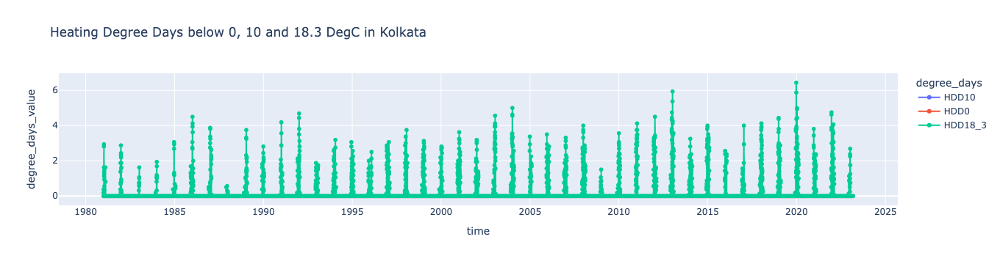

In [132]:
fig1 = px.line(HDD_kol_daily_joined_df_long, x="time", y="degree_days_value"
               , color="degree_days", markers=True, title='Heating Degree Days below 0, 10 and 18.3 DegC in Kolkata')

fig1.show()

In [139]:
ds_daily.EVPTRNS

<xarray.DataArray 'EVPTRNS' (time: 16071, lat: 361, lon: 576)>
dask.array<open_dataset-48ce4abbbfadea3a807e6be234ef8632EVPTRNS, shape=(16071, 361, 576), dtype=float64, chunksize=(14610, 5, 5), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 -90.0 -89.5 -89.0 -88.5 -88.0 ... 88.5 89.0 89.5 90.0
  * lon      (lon) float64 -180.0 -179.4 -178.8 -178.1 ... 178.1 178.8 179.4
  * time     (time) datetime64[ns] 1981-01-01 1981-01-02 ... 2024-12-31
Attributes:
    long_name:      Evapotranspiration Energy Flux
    standard_name:  Evapotranspiration_Energy_Flux
    units:          W m-2
    valid_max:      1500.0
    valid_min:      0.0
    valid_range:    [0.0, 1500.0]